In [1]:
import cv2
import numpy as np
import glob
import matplotlib.pyplot as plt
import traceback
import os
from math import atan2, asin, degrees

In [2]:
CAMERA = 'oakd'
CALIBRATION_PATH = './calibration'
PATH = './find_pose'
CAMERA_CALIBRATION = f'{CALIBRATION_PATH}/{CAMERA}/calib_data_oakd.npz'


TOP, BOTTOM, LEFT, RIGHT = 200, 1800, 200, 3400
THRESHOLD = 90
MAX_IOU_ERROR = 0.1
TEXT_SIZE = 3

In [3]:
precalc = {
    'capture_1756299630.png': np.array([
        [[1354,  864]],
        [[1348, 1136]],
        [[2154, 1161]],
        [[2158, 1026]]
    ], dtype=np.int32),
    'capture_1756299611.png': np.array([
        [[1380,  905]],
        [[1347, 1137]],
        [[2152, 1178]],
        [[2153, 1062]]
    ], dtype=np.int32),
    'capture_1756300966.png': np.array([
        [[1378,  877]],
        [[1349, 1119]],
        [[2166, 1160]],
        [[2168, 1036]]
    ], dtype=np.int32),
    'capture_1756304735.png': np.array([
        [[1265,  821]],
        [[1236, 1046]],
        [[2031, 1069]],
        [[2030,  952]]
    ], dtype=np.int32),
    'capture_1756304769.png': np.array([
        [[1248,  794]],
        [[1235, 1051]],
        [[2033, 1067]],
        [[2034,  938]]
    ], dtype=np.int32),
    'capture_1756304784.png': np.array([
        [[1238,  783]],
        [[1233, 1052]],
        [[2031, 1076]],
        [[2036,  943]]
    ], dtype=np.int32),
    'capture_1756305443.png': np.array([
        [[1323,  421]],
        [[1233, 1050]],
        [[1503, 1062]],
        [[1444,  426]]
    ], dtype=np.int32),
    'capture_1756305458.png': np.array([
        [[1265,  820]],
        [[1234, 1047]],
        [[2028, 1073]],
        [[2029,  955]]
    ], dtype=np.int32),
    'capture_1756305500.png': np.array([
        [[1251,  787]],
        [[1223, 1023]],
        [[2032, 1051]],
        [[2034,  929]]
    ], dtype=np.int32)
}

In [4]:
# Plate3 3D printed
obj_pts = np.array([
    [0, 0, 0],
    [0, 50, 0],
    [150, 50, 0],
    [150, 25, 0],
], dtype=np.float32)

In [5]:
data = np.load(CAMERA_CALIBRATION)
camera_matrix = data['camera_matrix']
dist_coeffs = data['dist_coeffs']

print(camera_matrix)

[[3.14212361e+03 0.00000000e+00 1.92260024e+03]
 [0.00000000e+00 3.14649877e+03 1.08610836e+03]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]


In [6]:
def rotationMatrixToRPY(R):
    sy = np.sqrt(R[0,0]**2 + R[1,0]**2)
    singular = sy < 1e-6
    if not singular:
        x = atan2(R[2,1], R[2,2])
        y = atan2(-R[2,0], sy)
        z = atan2(R[1,0], R[0,0])
    else:
        x = atan2(-R[1,2], R[1,1])
        y = atan2(-R[2,0], sy)
        z = 0
    return degrees(x), degrees(y), degrees(z)

def rotations_and_flips(points):
    n = len(points)
    for shift in range(n):
        yield np.roll(points, shift, axis=0)
        yield np.flip(np.roll(points, shift, axis=0), axis=0)

./find_pose/oakd/capture_1756299611.png
Using predifined mask


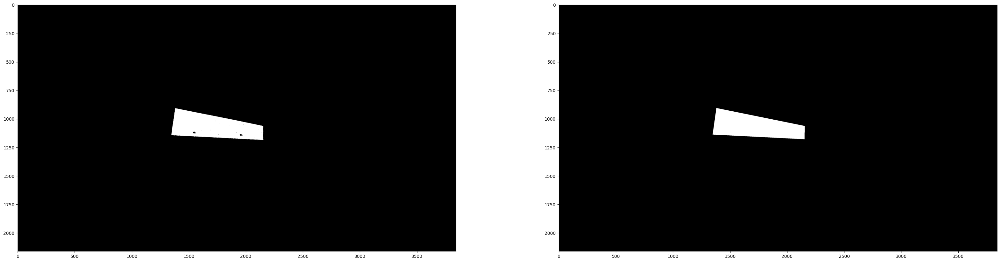

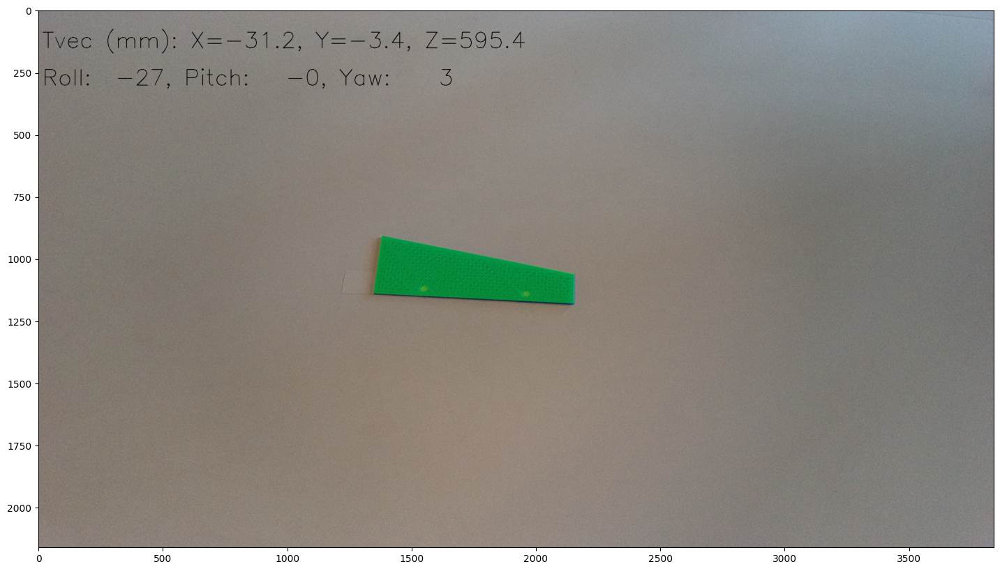

./find_pose/oakd/capture_1756299630.png
Using predifined mask


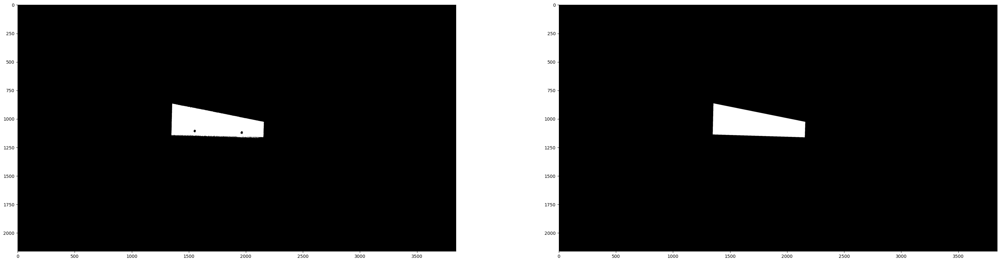

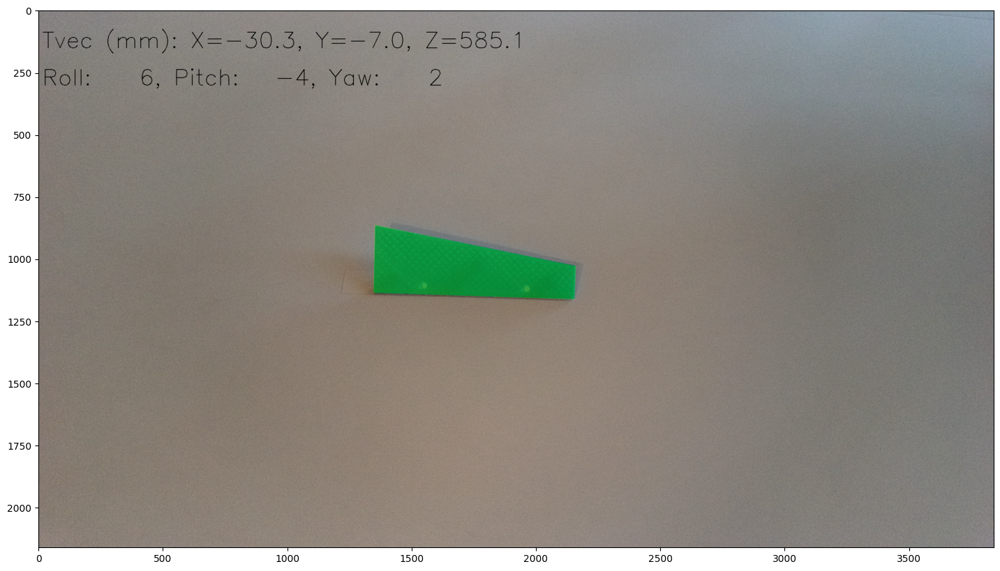

./find_pose/oakd/capture_1756300966.png
Using predifined mask


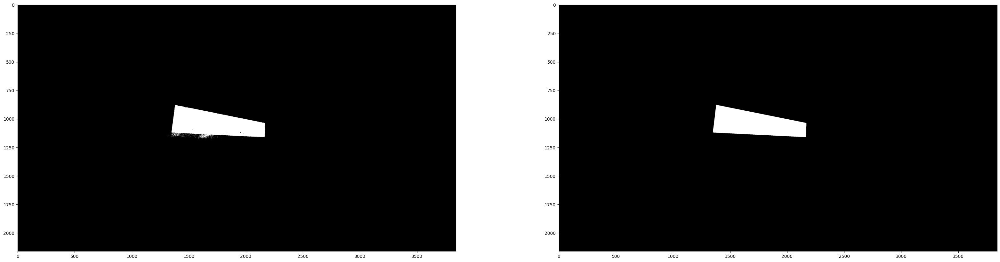

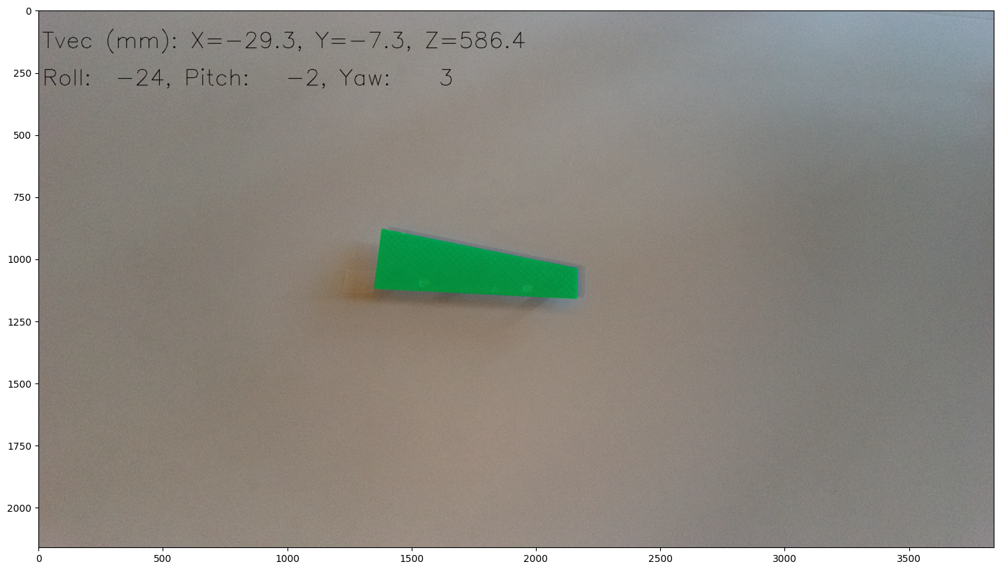

./find_pose/oakd/capture_1756304735.png
Using predifined mask


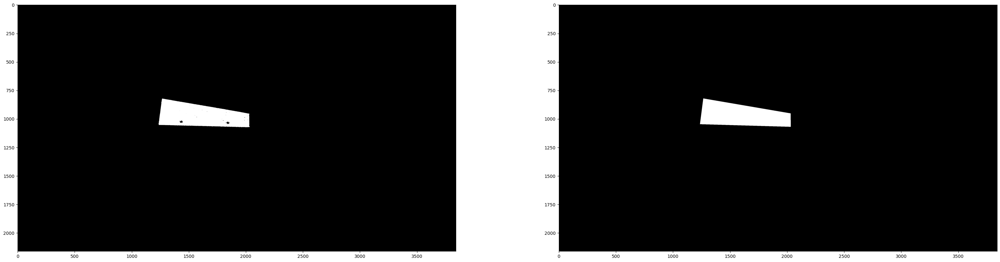

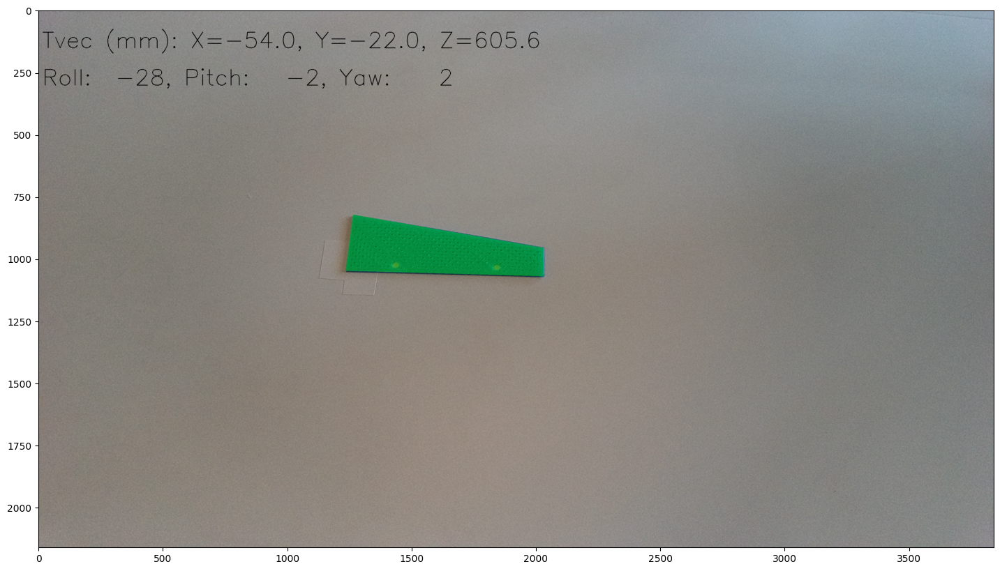

./find_pose/oakd/capture_1756304769.png
Using predifined mask


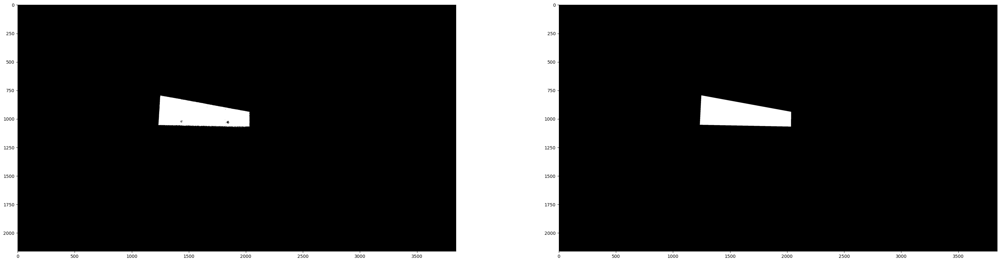

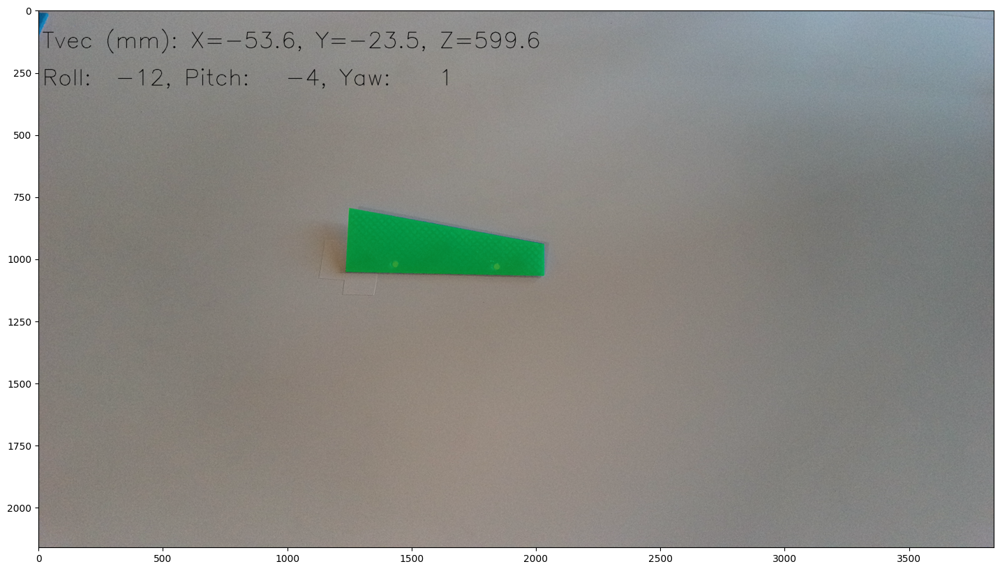

./find_pose/oakd/capture_1756304784.png
Using predifined mask


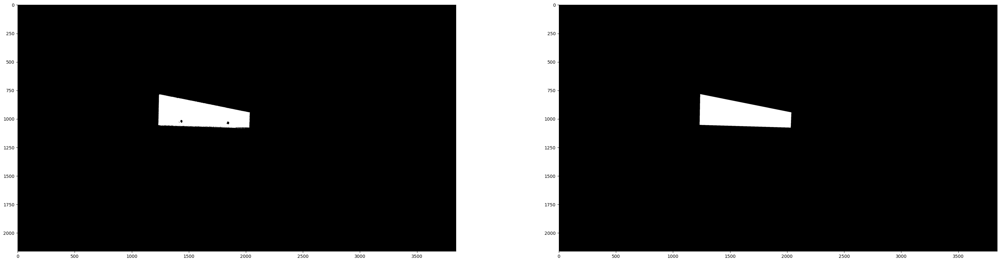

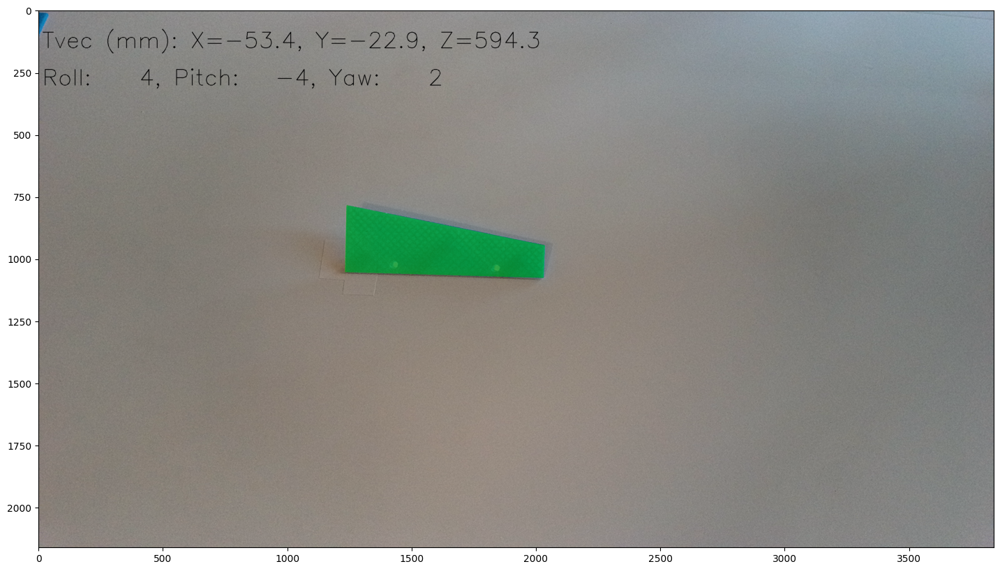

./find_pose/oakd/capture_1756305443.png
Using predifined mask


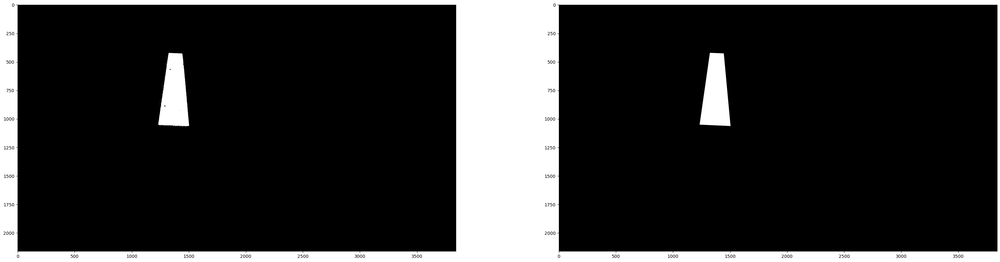

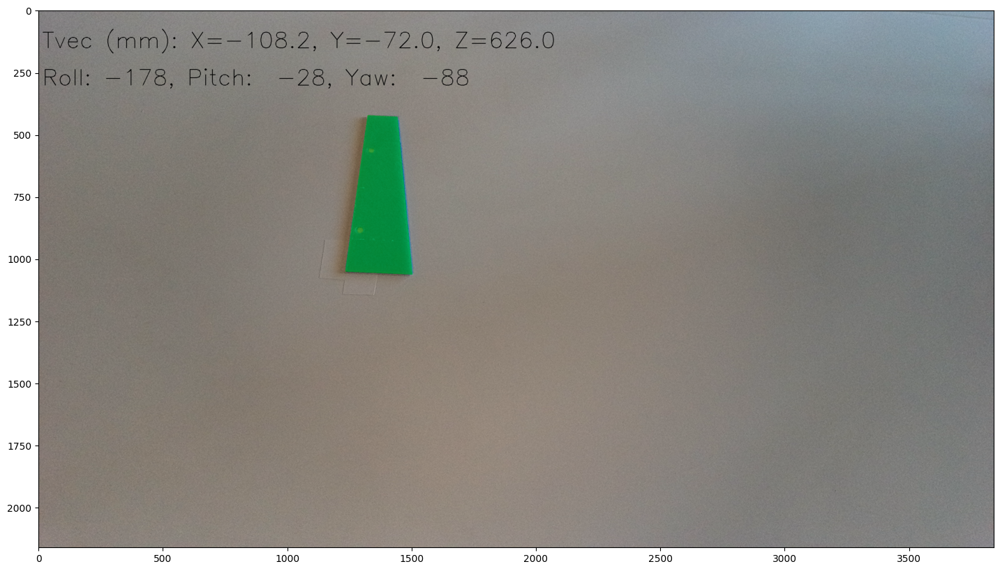

./find_pose/oakd/capture_1756305458.png
Using predifined mask


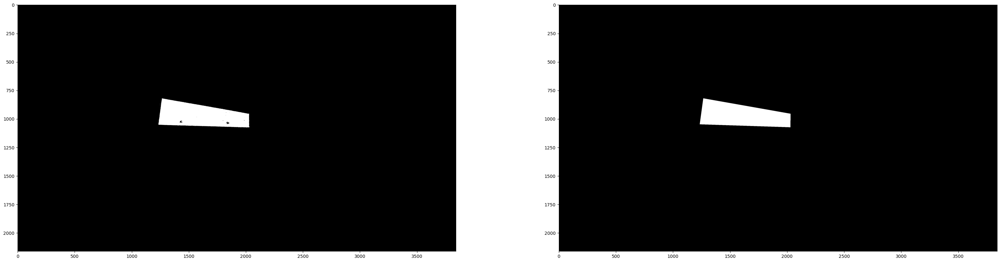

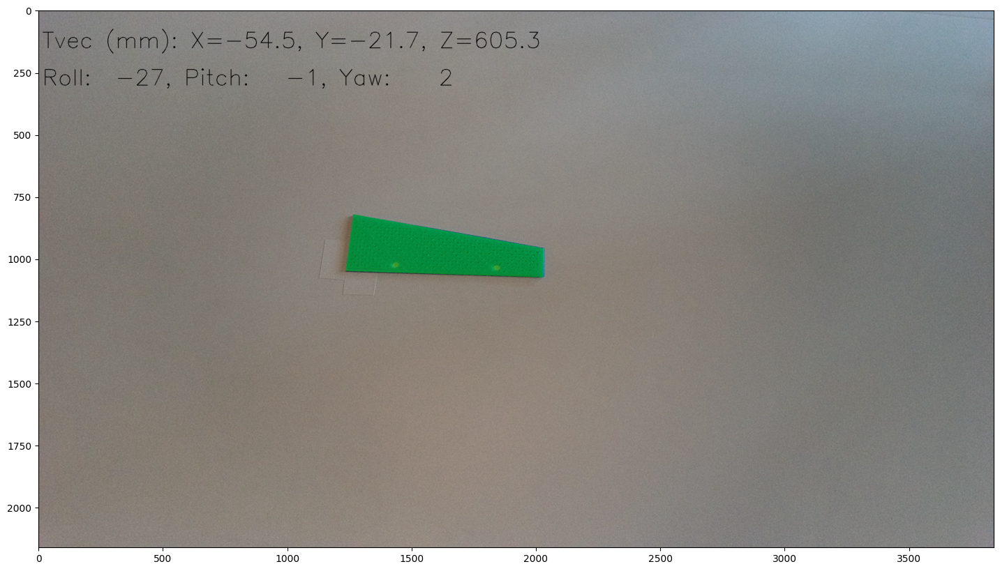

./find_pose/oakd/capture_1756305500.png
Using predifined mask


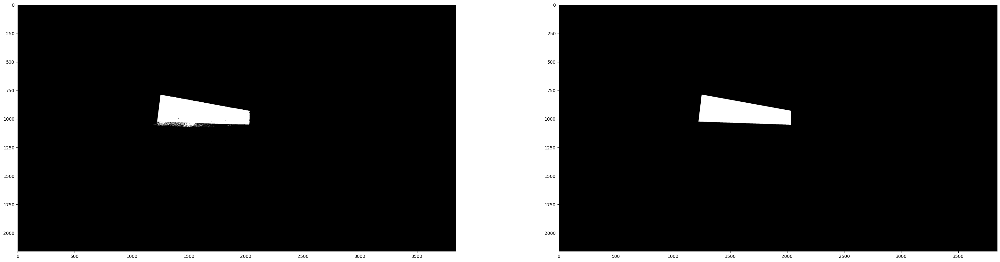

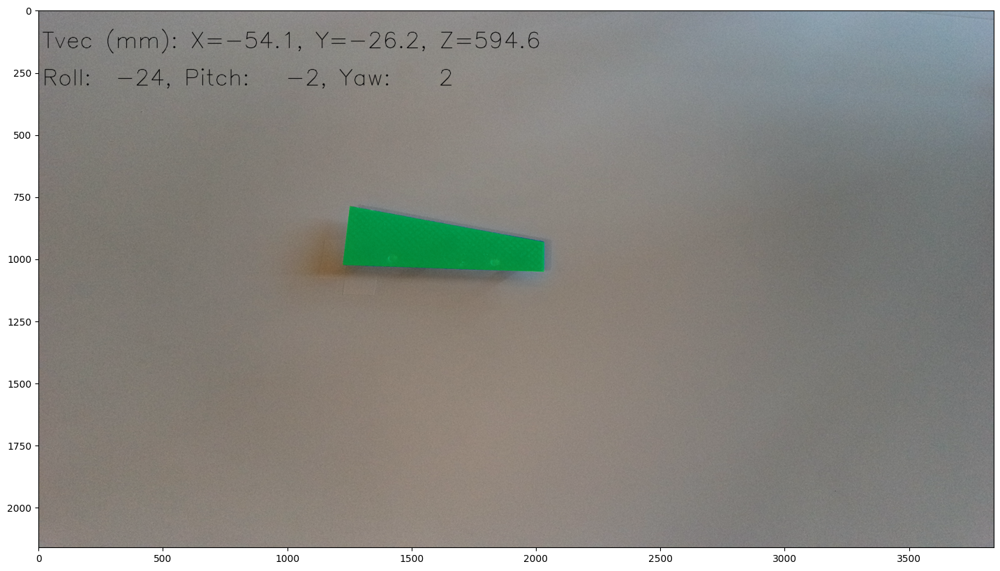

In [7]:
for image_path in sorted(glob.glob(f'{PATH}/{CAMERA}/*')):
    print(image_path)
    frame = cv2.imread(image_path)

    processed = frame.copy()
    frame_grayscale = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    # undistorted = cv2.undistort(frame_grayscale, camera_matrix, dist_coeffs)

    cropped = 255 * np.ones(frame_grayscale.shape, dtype=np.uint8)
    cropped[TOP:BOTTOM, LEFT:RIGHT] = frame_grayscale[TOP:BOTTOM, LEFT:RIGHT]

    _, binary = cv2.threshold(cropped, THRESHOLD, 255, cv2.THRESH_BINARY)
    binary = 255 - binary

    try:
        filename = os.path.basename(image_path)
        if filename in precalc:
            print('Using predifined mask')
            approx = precalc[filename]
        else:
            cnts, _ = cv2.findContours(
                binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
            if len(cnts) > 0:
                cnt = max(cnts, key=cv2.contourArea)
                epsilon = 0.02 * cv2.arcLength(cnt, True)
                approx = cv2.approxPolyDP(cnt, epsilon, True)
        
        img_pts = approx.reshape(-1, 2).astype(np.float32)
        contour_to_draw = approx  # shape: (N,1,2)
        contour = np.zeros(frame_grayscale.shape, dtype=np.uint8)
        cv2.drawContours(contour, [contour_to_draw], -1, 255, -1)
        
        plt.figure(figsize=(40,10))
        plt.subplot(121)
        plt.imshow(binary, 'gray')
        plt.subplot(122)
        plt.imshow(contour, 'gray')

        best_error = float('inf')
        best_rvec, best_tvec = None, None

        for candidate_points in rotations_and_flips(img_pts):
            success = False
            try:
                success, rvec, tvec, inliers = cv2.solvePnPRansac(
                    objectPoints=obj_pts,
                    imagePoints=candidate_points,
                    cameraMatrix=camera_matrix,
                    distCoeffs=dist_coeffs,
                    reprojectionError=0.5,
                    confidence=0.99,
                    flags=cv2.SOLVEPNP_ITERATIVE
                )
            except Exception as x:
                pass
                # traceback.print_exception(x)
            if success:
                proj, _ = cv2.projectPoints(
                    obj_pts, rvec, tvec, camera_matrix, dist_coeffs)
                proj = proj.squeeze().astype(np.int32)
                mask_proj = np.zeros(binary.shape, dtype=np.uint8)
                cv2.fillPoly(mask_proj, [proj], 255)
                intersection = np.logical_and(
                    mask_proj > 0, contour > 0).sum()
                union = np.logical_or(mask_proj > 0, contour > 0).sum()
                iou = intersection / union if union > 0 else 0
                error = 1 - iou
                if error < best_error:
                    best_error = error
                    best_rvec, best_tvec = rvec.copy(), tvec.copy()

        rvec = best_rvec
        tvec = best_tvec

        if best_error < MAX_IOU_ERROR:
            # Text info
            R, _ = cv2.Rodrigues(rvec)
            point_in_cam = R @ np.mean(obj_pts,
                                       axis=0).reshape(3, 1) + tvec
            tx, ty, tz = tuple(point_in_cam.flatten())
            text = f'Tvec (mm): X={tx:.1f}, Y={ty:.1f}, Z={tz:.1f}'
            cv2.putText(processed, text, (15,  int(TEXT_SIZE / 0.1 * 5)), cv2.FONT_HERSHEY_SIMPLEX,
                        TEXT_SIZE, (0, 0, 0), 2)
            roll, pitch, yaw = rotationMatrixToRPY(R)
            text = f'Tvec (mm): X={tx:.1f}, Y={ty:.1f}, Z={tz:.1f}'
            cv2.putText(processed, f'Roll: {roll:4.0f}, Pitch: {pitch:4.0f}, Yaw: {yaw:4.0f}',
                        (15,  int(TEXT_SIZE / 0.1 * 10)), cv2.FONT_HERSHEY_SIMPLEX, TEXT_SIZE, (0, 0, 0), 2)

            # Object overlay
            img_points_proj, _ = cv2.projectPoints(
                obj_pts, rvec, tvec, camera_matrix, dist_coeffs)
            pts = np.int32(img_points_proj).reshape(-1, 2)
            overlay = processed.copy()
            cv2.fillPoly(overlay, [pts], (0, 255, 0))
            alpha = 0.4
            processed = cv2.addWeighted(
                overlay, alpha, processed, 1 - alpha, 0)

        plt.figure(figsize=(40,10))
        plt.imshow(cv2.cvtColor(processed, cv2.COLOR_BGR2RGB))
        plt.show()

    except Exception as x:
        pass
        # traceback.print_exception(x)